In [197]:
import numpy as np
import pandas as pd
import pprint as pp
from datetime import datetime
import dataframe_image as dfi

%load_ext autoreload
%autoreload 2

import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import seaborn as sns
sns.set_context("talk")
sns.set(rc={'figure.figsize': (16, 9.)})
sns.set_style("whitegrid")


# to display offline interactive plots
import plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

# mapping library
import cufflinks as cf
import plotly.express as px
import plotly.graph_objects as go
from urllib.request import urlopen
import json

# to export plots to html
import plotly.io as pio
#import chart_studio

# hide annoying repeated deprec warnings (statsmodel issue)
import warnings
warnings.simplefilter('once', category=UserWarning)


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Load data

In [147]:
source = 'http://insideairbnb.com/get-the-data.html'
oct2020 = 'http://data.insideairbnb.com/france/ile-de-france/paris/2020-10-12/visualisations/listings.csv'
localpath = 'data/listings.csv'
#df = pd.read_csv(oct2020)
#df = pd.read_csv(localpath)
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2577,Loft for 4 by Canal Saint Martin,2827,Karine,NaN,Entrepôt,48.86993,2.36251,Entire home/apt,125,3,1,2019-01-02,0.05,1,321
1,3109,zen and calm,3631,Anne,NaN,Observatoire,48.83349,2.31852,Entire home/apt,60,2,9,2019-10-24,0.19,1,365
2,4886,Country-Style Studio Hip Area FREE CRUISE & WIFI,6792,Ryan Of Cobblestone,NaN,Popincourt,48.86528,2.37115,Entire home/apt,89,3,25,2019-05-06,0.18,11,0
3,4890,Quiet Historic & Cute +Free Cruise,6792,Ryan Of Cobblestone,NaN,Temple,48.86409,2.35651,Entire home/apt,103,4,23,2020-09-07,0.21,11,72
4,5396,Explore the heart of old Paris,7903,Borzou,NaN,Hôtel-de-Ville,48.85100,2.35869,Entire home/apt,48,1,225,2020-08-08,1.64,1,76


In [148]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66334 entries, 0 to 66333
Data columns (total 16 columns):
id                                66334 non-null int64
name                              66270 non-null object
host_id                           66334 non-null int64
host_name                         66314 non-null object
neighbourhood_group               0 non-null float64
neighbourhood                     66334 non-null object
latitude                          66334 non-null float64
longitude                         66334 non-null float64
room_type                         66334 non-null object
price                             66334 non-null int64
minimum_nights                    66334 non-null int64
number_of_reviews                 66334 non-null int64
last_review                       51269 non-null object
reviews_per_month                 51269 non-null float64
calculated_host_listings_count    66334 non-null int64
availability_365                  66334 non-null int64
dt

# Helper functions

In [201]:
def save_fig(plot, fname, dpi):
    fig = plot.get_figure()
    fig.savefig(fname, dpi)


# Basic info about the data

In [7]:
df.notnull().mean().sort_values()

neighbourhood_group               0.000000
last_review                       0.772892
reviews_per_month                 0.772892
name                              0.999035
host_name                         0.999698
id                                1.000000
host_id                           1.000000
neighbourhood                     1.000000
latitude                          1.000000
longitude                         1.000000
room_type                         1.000000
price                             1.000000
minimum_nights                    1.000000
number_of_reviews                 1.000000
calculated_host_listings_count    1.000000
availability_365                  1.000000
dtype: float64

In [109]:
df = df.dropna(how='all', axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66334 entries, 0 to 66333
Data columns (total 15 columns):
id                                66334 non-null int64
name                              66270 non-null object
host_id                           66334 non-null int64
host_name                         66314 non-null object
neighbourhood                     66334 non-null object
latitude                          66334 non-null float64
longitude                         66334 non-null float64
room_type                         66334 non-null object
price                             66334 non-null int64
minimum_nights                    66334 non-null int64
number_of_reviews                 66334 non-null int64
last_review                       51269 non-null object
reviews_per_month                 51269 non-null float64
calculated_host_listings_count    66334 non-null int64
availability_365                  66334 non-null int64
dtypes: float64(3), int64(7), object(5)
memory usage: 7

## Distributions

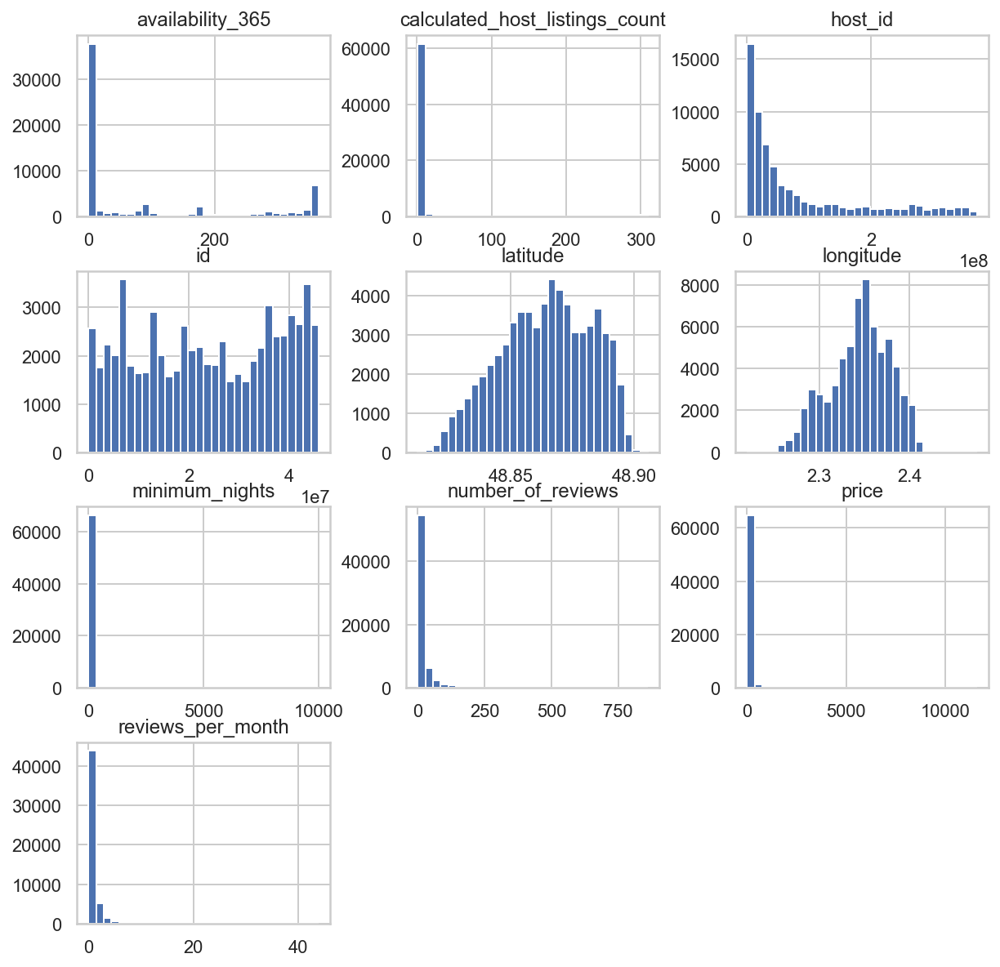

In [110]:
df.hist(figsize=(10,10), bins=30);

Not terribly informative. Let's try with a log y-axis.

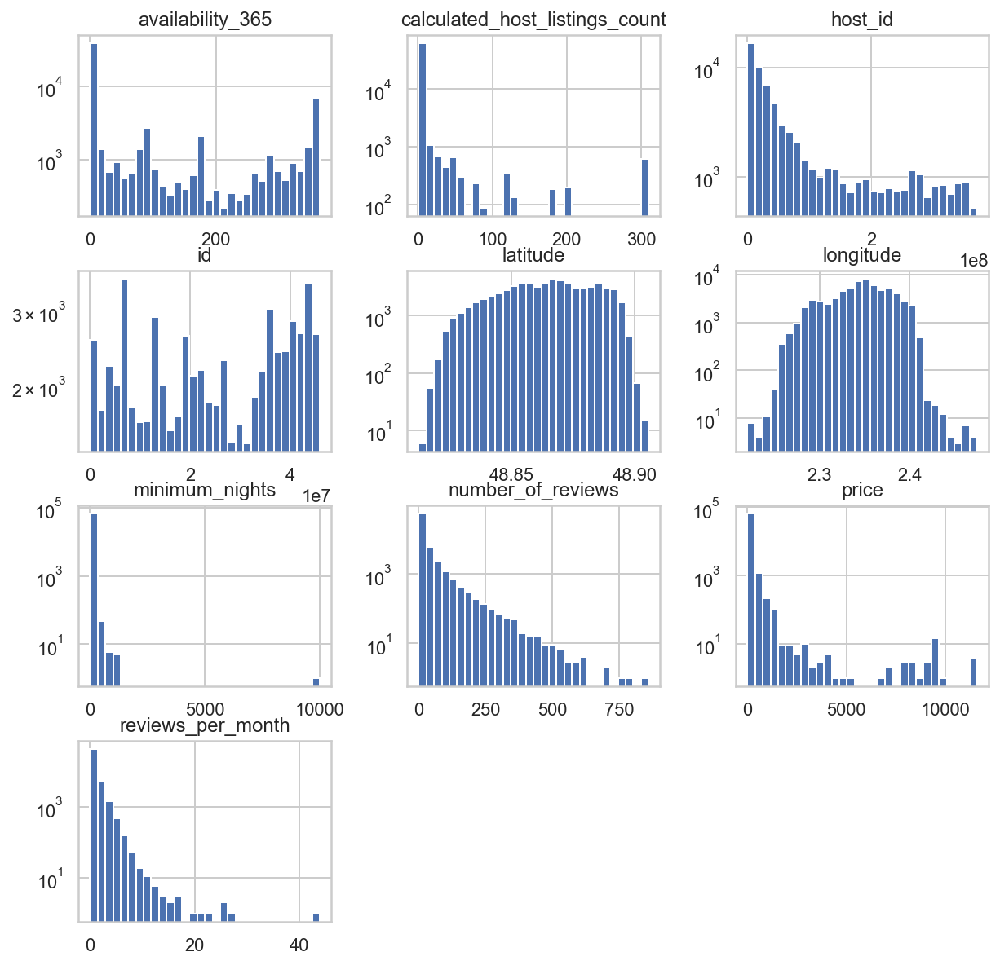

In [111]:
# distributions with log y-axis

df.hist(figsize=(10,10), bins=30, log=True);

Still not that informative. Let's examine some columns individually.

## Where are they?

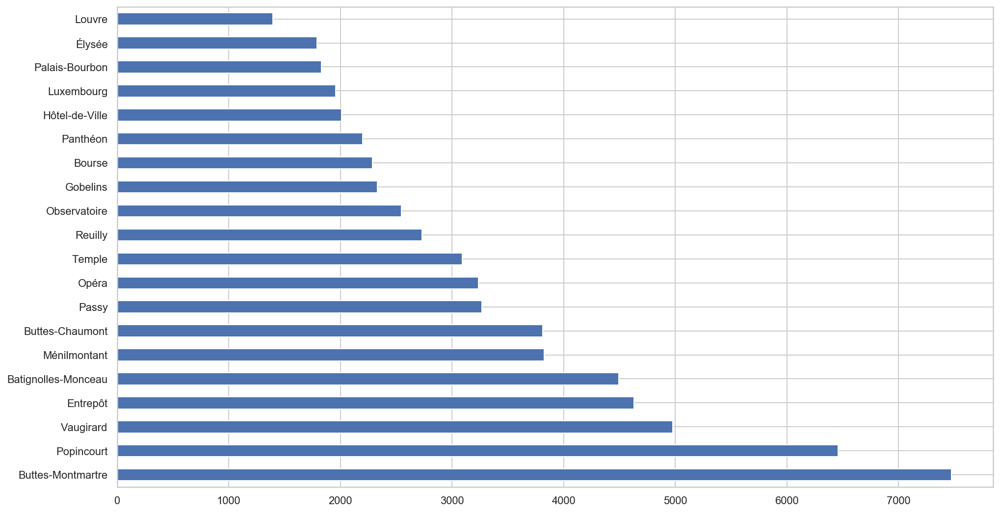

In [198]:
# distribution by location

bars = df['neighbourhood'].value_counts().plot(kind='barh');

In [204]:
fig = bars.get_figure()
fname = "../learning/learning/assets/images/2020/dec3_bar_chart2.png"
fig.savefig(fname, dpi=600)

Not surprised to see Buttes-Montmartre here, I've heard enough stories in the papers and from friends. Vaugirard, in the 15th - tourist Siberia - is more a surprise.

A lot of these neighbourhoods I don't recognize - Entrepôt? Nor am I sure where our quartier slots in. 

## Price range

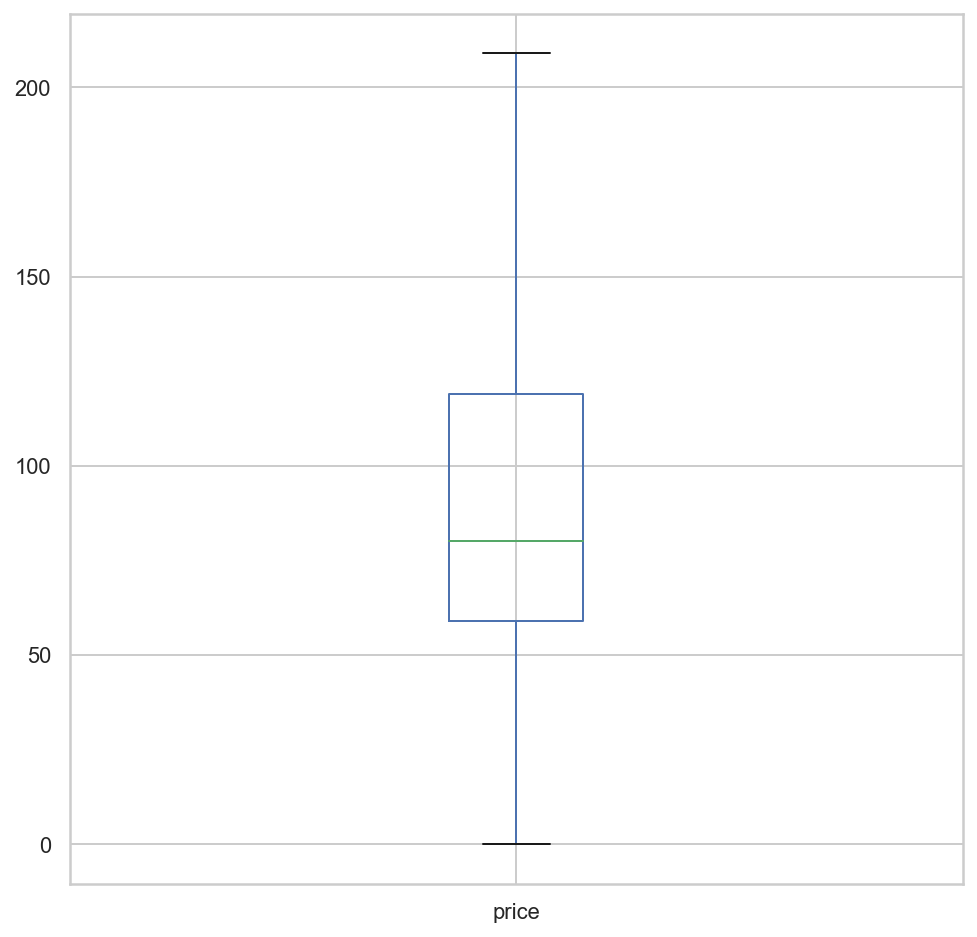

In [136]:
# what's the typical price range?

df['price'].plot(kind='box', figsize=(8,8), showfliers=False);

The median price looks to be about 70 (euros or USD?)

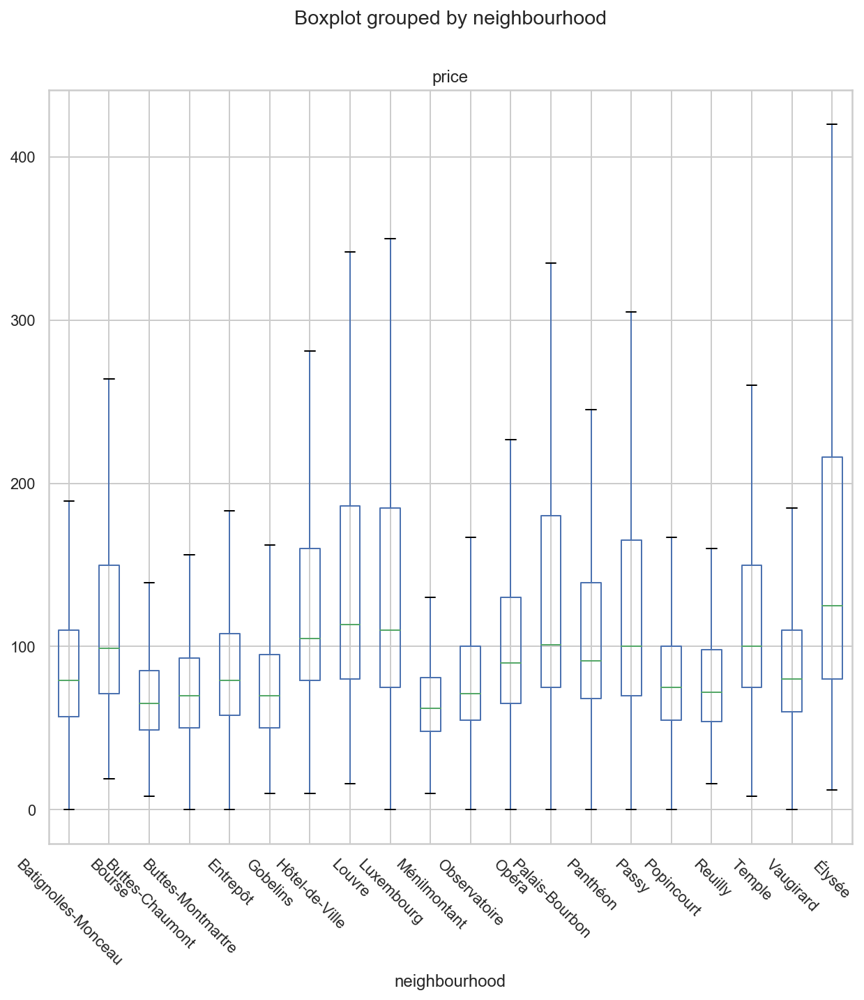

In [133]:
# how does the price differ by neighbourhood?

sorted_hoods = df.groupby('neighbourhood')['price'].mean().sort_values()
df.boxplot('price', by='neighbourhood', showfliers=False, rot=-45, figsize=(10,10), );

Elysee is clearly the winner here. Many neighbourhoods have 0 as there minimum price, though. Is that even a legit value?

## Listings per host

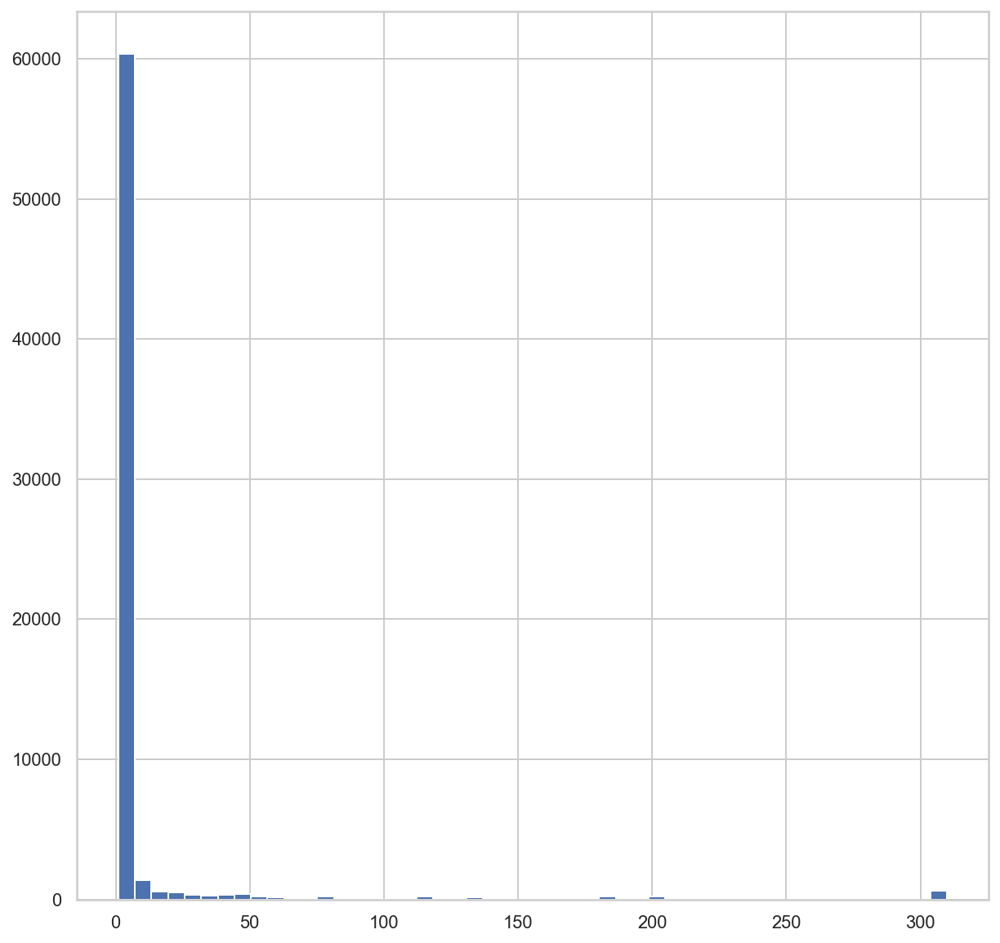

In [137]:
# listings per host
df['calculated_host_listings_count'].hist(figsize=(10,10), bins=50);

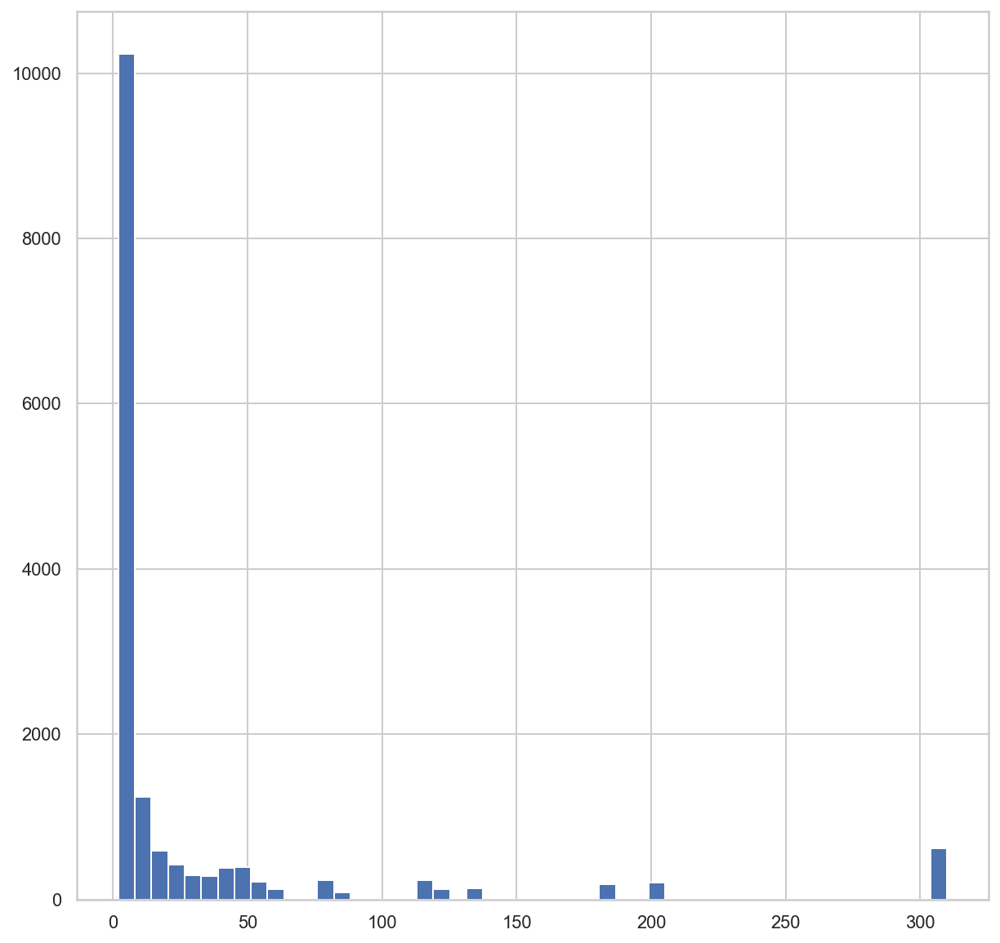

In [44]:
# exclude hosts with single listings

q = "calculated_host_listings_count > 1"
df.query(q)['calculated_host_listings_count'].hist(figsize=(10,10), bins=50);

In [138]:
# single list vs multiple
col = 'calculated_host_listings_count'
multi_list = df[col] > 1
title = "Hosts with more than one listing"
multi_list.value_counts().iplot(kind='bar', title=title);

Nearly a quarter of hosts have multiple listings.

## How many days are they available for rent?

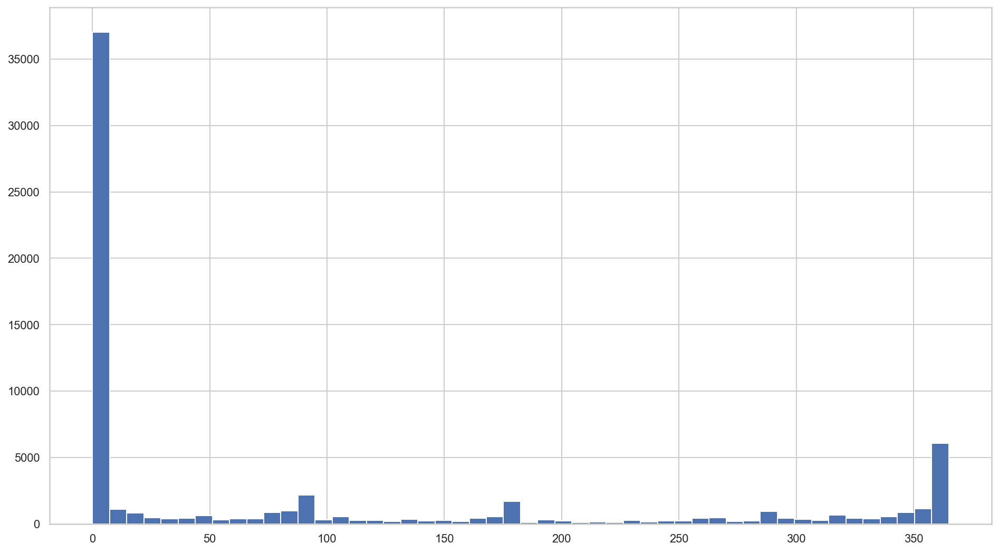

In [139]:
# what is the range of availabilities?

col = "availability_365"
df[col].hist(bins=50);

In [144]:
# how many are for > 90 days

longer = df[col] > 90
longer.value_counts().iplot(kind='bar', title="Listings available for more than 90 days of the year")

Nearly a third of listings (21k out of 66k) are available for more than 90 days of the year. 

Who is it breaking the rules? I would suspect the mega-listers. 

# Map

In [150]:
# process geojson file

paris_geos = 'http://data.insideairbnb.com/france/ile-de-france/paris/2020-10-12/visualisations/neighbourhoods.geojson'

with urlopen(paris_geos) as response:
    paris_hoods = json.load(response)
    

In [169]:
# what's the id key?

for feat in paris_hoods['features']:
    print(feat['properties'])

{'neighbourhood': 'Batignolles-Monceau', 'neighbourhood_group': None}
{'neighbourhood': 'Palais-Bourbon', 'neighbourhood_group': None}
{'neighbourhood': 'Buttes-Chaumont', 'neighbourhood_group': None}
{'neighbourhood': 'Opéra', 'neighbourhood_group': None}
{'neighbourhood': 'Entrepôt', 'neighbourhood_group': None}
{'neighbourhood': 'Gobelins', 'neighbourhood_group': None}
{'neighbourhood': 'Vaugirard', 'neighbourhood_group': None}
{'neighbourhood': 'Reuilly', 'neighbourhood_group': None}
{'neighbourhood': 'Louvre', 'neighbourhood_group': None}
{'neighbourhood': 'Luxembourg', 'neighbourhood_group': None}
{'neighbourhood': 'Élysée', 'neighbourhood_group': None}
{'neighbourhood': 'Temple', 'neighbourhood_group': None}
{'neighbourhood': 'Ménilmontant', 'neighbourhood_group': None}
{'neighbourhood': 'Panthéon', 'neighbourhood_group': None}
{'neighbourhood': 'Passy', 'neighbourhood_group': None}
{'neighbourhood': 'Observatoire', 'neighbourhood_group': None}
{'neighbourhood': 'Popincourt', 'n

In [167]:
hoods = []
for feat in paris_hoods['features']:
    hood = feat['properties']['neighbourhood']
    hoods.append(hood)
    
hoods

['Batignolles-Monceau',
 'Palais-Bourbon',
 'Buttes-Chaumont',
 'Opéra',
 'Entrepôt',
 'Gobelins',
 'Vaugirard',
 'Reuilly',
 'Louvre',
 'Luxembourg',
 'Élysée',
 'Temple',
 'Ménilmontant',
 'Panthéon',
 'Passy',
 'Observatoire',
 'Popincourt',
 'Bourse',
 'Buttes-Montmartre',
 'Hôtel-de-Ville']

In [168]:
q = "neighbourhood in @hoods"

df.query(q)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2577,Loft for 4 by Canal Saint Martin,2827,Karine,NaN,Entrepôt,48.86993,2.36251,Entire home/apt,125,3,1,2019-01-02,0.05,1,321
1,3109,zen and calm,3631,Anne,NaN,Observatoire,48.83349,2.31852,Entire home/apt,60,2,9,2019-10-24,0.19,1,365
2,4886,Country-Style Studio Hip Area FREE CRUISE & WIFI,6792,Ryan Of Cobblestone,NaN,Popincourt,48.86528,2.37115,Entire home/apt,89,3,25,2019-05-06,0.18,11,0
3,4890,Quiet Historic & Cute +Free Cruise,6792,Ryan Of Cobblestone,NaN,Temple,48.86409,2.35651,Entire home/apt,103,4,23,2020-09-07,0.21,11,72
4,5396,Explore the heart of old Paris,7903,Borzou,NaN,Hôtel-de-Ville,48.85100,2.35869,Entire home/apt,48,1,225,2020-08-08,1.64,1,76
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66329,45823497,Room with huge balcony in Paris,17260870,Daniel,NaN,Ménilmontant,48.86866,2.39931,Private room,32,2,0,NaN,NaN,1,0
66330,45824219,Loft sur cour privée à Montmartre,6709302,Audrey,NaN,Buttes-Montmartre,48.88555,2.33234,Entire home/apt,90,2,0,NaN,NaN,2,77
66331,45824371,Appartement avec vue sur Montmartre,65338210,Elise,NaN,Batignolles-Monceau,48.89068,2.32181,Entire home/apt,45,2,0,NaN,NaN,1,10
66332,45825687,Appartement sur Paris 15eme,83264630,Lydie,NaN,Vaugirard,48.84184,2.27786,Entire home/apt,45,2,0,NaN,NaN,1,79


In [164]:
listings = df['neighbourhood'].value_counts().reset_index()
listings.columns = ['neighbourhood', 'listings']

In [205]:
title = "Where the airbnbs are in Paris"
fig = px.choropleth(listings, geojson=paris_hoods, color='listings', 
              locations='neighbourhood', featureidkey='properties.neighbourhood',
               color_continuous_scale="Dense", title=title)

fig.update_geos(fitbounds="locations",
                    visible=False)

fig.show()


In [207]:
# add locations

cars = px.data.carshare()
cars.head()

,centroid_lat,centroid_lon,car_hours,peak_hour
0,45.471549,-73.588684,1772.750000,2
1,45.543865,-73.562456,986.333333,23
2,45.487640,-73.642767,354.750000,20
3,45.522870,-73.595677,560.166667,23
4,45.453971,-73.738946,2836.666667,19


In [224]:

px.set_mapbox_access_token(token)
#fig = px.scatter_mapbox(cars, lat="centroid_lat", lon="centroid_lon",     color="peak_hour", size="car_hours",
                  #color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10)
#fig.show()

In [222]:
fig = px.scatter_mapbox(df, lat="latitude", lon="longitude", color="room_type", zoom=11,
                       hover_name='name', opacity=0.2)
fig.show()

In [214]:
import dash
import dash_core_components as dcc
import dash_html_components as html

app = dash.Dash()
app.layout = html.Div([
    dcc.Graph(figure=fig)
])

app.run_server(debug=True, use_reloader=False)

ModuleNotFoundError: No module named 'dash'